In [1]:
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

In [2]:
import matplotlib.pyplot as plt

In [3]:
import seaborn as sns

In [4]:
df = pd.read_csv('part_10.csv')
df.shape

(57845, 8)

In [5]:
df.head(3)

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,MATCHED_VARIABLE_VALUE,EVENT_ID
0,188.138.92.55,NaN,166,404,REQUEST_URI,NaN,//tmp/20160925122692indo.php.vob,AVdhXFgVq1Ppo9zF5Fxu
1,93.158.215.131,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,431,302,REQUEST_GET_ARGS,url,http://www.galitsios.gr/?option=com_k2,AVdcJmIIq1Ppo9zF2YIp
2,176.123.240.64,Mozilla/5.0 (Windows NT 6.0; rv:34.0) Gecko/20...,395,403,REQUEST_PATH,NaN,"/opinion/page1_3.php\"" and \""\""x\""\""=\""\""x\""",iz7SN2YBrgKk_RFNZW_U


In [6]:
cols_describe = [df[df.columns[i]].describe() for i in range(len(df.columns))]
print(*cols_describe, sep='\n'*3)

count              57838
unique             24940
top       217.175.140.69
freq               11286
Name: CLIENT_IP, dtype: object


count                                                 57517
unique                                                 6992
top       Mozilla/5.0 (Windows NT 6.1; WOW64; Trident/7....
freq                                                   2117
Name: CLIENT_USERAGENT, dtype: object


count     57794
unique     5758
top         259
freq        261
Name: REQUEST_SIZE, dtype: object


count     57770
unique       60
top         200
freq      25771
Name: RESPONSE_CODE, dtype: object


count                57730
unique                  21
top       REQUEST_GET_ARGS
freq                 20812
Name: MATCHED_VARIABLE_SRC, dtype: object


count                  53167
unique                  3209
top       REQUEST_GET_ARGS._
freq                   11165
Name: MATCHED_VARIABLE_NAME, dtype: object


count                                                 57683
unique       

In [7]:
#df.loc[df.CLIENT_IP=='217.175.140.69']

In [8]:
# самый часто встречающийся event_id:
#df.loc[df.EVENT_ID=='cr1nJWQB5cBXmMW1hh_4']

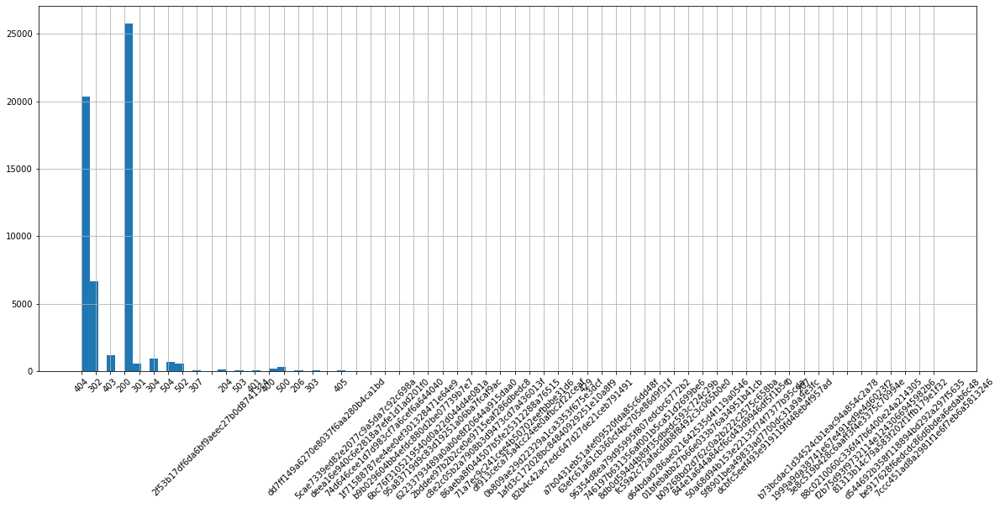

In [9]:
df.RESPONSE_CODE.hist(figsize=(20,8), bins=100);
plt.xticks(rotation=45)
plt.show();

In [10]:
df.RESPONSE_CODE.value_counts()

200                                 25771
404                                 20367
302                                  6630
403                                  1156
304                                   940
504                                   700
301                                   584
502                                   558
500                                   318
400                                   212
204                                   116
206                                    90
307                                    74
405                                    63
503                                    62
401                                    46
303                                    37
207                                     4
8db0d594d4b89f35dbedc593c724c29b        1
dcbfc5eef493e919119fd48eb4f957ad        1
fc59a2c72afacddb8f8492c3c065b0e0        1
d64bdad286ae021642535d4f119a0546        1
01bfebabb27b66e033b76a34951b41cb        1
b09268bd2d762c0a2b222c2575c658ba  

In [11]:
# куча левых респонз кодов,появившихся по 1 разу и похожих на искусственные, думаю, их можно удалить 

In [12]:
response_codes_ok = [226,431,451,510,511, list(range(100,104)), list(range(200,209)), list(range(300,309)), list(range(400,419)), list(range(421,430)), list(range(500,509))]

In [13]:
def flat_list(lst):
    res = []
    for sub in lst:
        if isinstance(sub, list):
            res.extend(flat_list(sub))
        else:
            res.append(str(sub))
    return res

In [14]:
# слишком много уникальных + айдишники чаще всего бесполезныб попробуем удалить
cols2drop = ['MATCHED_VARIABLE_VALUE','EVENT_ID']
response_codes_ok = flat_list(response_codes_ok)



In [15]:
df.shape

(57845, 8)

In [16]:
df_clean = df.drop(cols2drop, axis=1)
#df_clean = df_clean.loc[df_clean.RESPONSE_CODE.isin(response_codes_ok)]
print(df_clean.shape)
df_clean.sample(3)

(57845, 6)


,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME
35654,178.255.215.94,Mozilla/5.0 (compatible; Exabot/3.0; +http://w...,280,200,REQUEST_URI,NaN
12983,95.24.22.177,Mozilla/5.0 (Windows NT 6.1; WOW64) AppleWebKi...,1270,200,REQUEST_PATH,REQUEST_PATH
55823,188.126.40.41,Mozilla/5.0 (Windows NT 10.0; WOW64) AppleWebK...,1423,404,REQUEST_GET_ARGS,REQUEST_GET_ARGS._


In [17]:
# проверка признака CLIENT_IP на валидность
import ipaddress
def check_ip_valid(x):
    try:
        ip_obj = ipaddress.ip_address(x)
        if isinstance(ip_obj, ipaddress.IPv4Address) or isinstance(ip_obj, ipaddress.IPv6Address):
            return 1
        else:
            return 0
    except ValueError:
        return 0
df_clean['CLIENT_IP_VALID'] = df_clean['CLIENT_IP'].apply(lambda ip: check_ip_valid(ip))
df_clean.sample(3)

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_VALID
29473,151.80.41.169,Mozilla/5.0 (compatible; MJ12bot/v1.4.5; http:...,509,200,REQUEST_URI,NaN,1
37628,163.172.70.217,Mozilla/5.0 (compatible; AhrefsBot/5.2; +http:...,542,200,REQUEST_GET_ARGS,REQUEST_GET_ARGS._,1
33844,85.253.230.202,Mozilla/5.0 (Linux; Android 6.0.1; SAMSUNG SM-...,1264,200,REQUEST_HEADERS,REQUEST_HEADERS.X-csrftoken,1


In [18]:
df_clean.loc[df_clean.CLIENT_IP_VALID==0].shape


(147, 7)

In [19]:
# тут полно всякой подозрительной фигни. Можно в отдельный датафрейм соранить, потом смержить с чистым.
df_spooky = df_clean.loc[df_clean.CLIENT_IP_VALID==0]
df_spooky.to_csv('Bad_IP.csv', index=False)
df_spooky

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_VALID
50,"> -gOxT""O<Ghèe]Ø È8 G`Qf¾ñ }y ðù!T...",SQL Injection,AVdYz8-Wq1Ppo9zF0mzK,2f53b17df6da6bf9aeec27b0d87413c4,NaN,NaN,0
162,Remote Code Execution,AVdtgf8uq1Ppo9zF_hyd,4df2f46285c84ba39fa84fc4878214ae,NaN,NaN,NaN,0
590,2a01:598:9902:df0c:8115:691e:c38,Mozilla/5.0 (iPhone; CPU iPhone OS 9_3_5 like ...,1272,304,REQUEST_COOKIES,nf_wp_session,0
1308,"~@.*"")ۅ",SQL Injection,AVdsla-3q1Ppo9zF_J7c,dd7ff149a6270e8037f6aa280b4ca1bd,NaN,NaN,0
1894,Remote Code Execution,AVddr1QQq1Ppo9zF3Vuj,0b168993dda4ce786f3455d01e162a58,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...
55871,ÕBÿ,AVddkIdNq1Ppo9zF3QzL,NaN,NaN,NaN,NaN,0
55896,Remote Code Execution,AVdcvSoAq1Ppo9zF2y_z,1cc6e2fe3fcc728c132e90c43d6b787d,NaN,NaN,NaN,0
56858,2a00:1148:b0ba:2615:8b4:f98f:f56,Mozilla/5.0 (Macintosh; Intel Mac OS X 10_11_6...,812,200,REQUEST_URI,NaN,0
57452,NaN,NaN,NaN,NaN,NaN,NaN,0


In [20]:
#from ip2geotools.databases.noncommercial import DbIpCity
from tqdm import tqdm

In [65]:
import requests
# получим доп информацию по валидным ipv4
def get_ip_info(x):
    ip = x['CLIENT_IP']
    #valid_or_not = x['CLIENT_IP_VALID']
    params = ['query', 'status', 'country', 'countryCode', 'city', 'timezone', 'mobile', 
              'proxy', 'isp', 'asname', 'hosting', 'reverse']
    
    try:
        ip_obj = ipaddress.ip_address(ip).version
        if  ip_obj==4: #valid_or_not==1 and
            resp = requests.get(f'http://ip-api.com/json/{ip}', params={'fields': ','.join(params)})
            if resp.status_code==200:
                info = resp.json()
                if info['status']=='success':
                    return pd.Series(info)
                else:
                    return pd.Series({'status':'IpV4Unsuccess'})
                
        elif ip_obj==6: #valid_or_not==1 and 
            return pd.Series({'status':'IpV6HardToLocate'})
        else: 
            return pd.Series({'status':'None'})
    except (ipaddress.AddressValueError, requests.RequestException) as e:
        return pd.Series({'status':'Error', 'error_message':str(e)})
        
df_ip_info = pd.DataFrame()  
tqdm.pandas()
df_ip_info = df_clean.progress_apply(get_ip_info, axis=1)
#get_ip('188.40.78.78')

100%|█████████████████████████████████████████████████████████████████████████| 57698/57698 [10:39:24<00:00,  1.50it/s]


In [ ]:
df_ip_info.to_csv('VALID_IP_INFO.csv', index=False)

In [21]:
df_ip_info = pd.read_csv('VALID_IP_INFO.csv')
print(df_ip_info.shape)
df_ip_info.head()

(57698, 13)


,asname,city,country,countryCode,error_message,hosting,isp,mobile,proxy,query,reverse,status,timezone
0,GD-EMEA-DC-SXB1,Strasbourg,France,FR,NaN,True,Host Europe GmbH,False,False,188.138.92.55,pro1523.startdedicated.de,success,Europe/Paris
1,Serverius-as,Amsterdam,Netherlands,NL,NaN,True,Serverius Holding B.V.,False,False,93.158.215.131,10gbpsnl.greencloudvps.com,success,Europe/Amsterdam
2,AS-MEGALINE-KG,Bishkek,Kyrgyzstan,KG,NaN,False,ispaceroute,False,False,176.123.240.64,176-123-240-64.mega.kg,success,Asia/Bishkek
3,CMCS,Denver,United States,US,NaN,False,Comcast Cable Communications,False,False,73.78.81.63,c-73-78-81-63.hsd1.co.comcast.net,success,America/Denver
4,GOOGLE,Mountain View,United States,US,NaN,True,Google LLC,False,False,66.102.9.44,google-proxy-66-102-9-44.google.com,success,America/Los_Angeles


In [22]:
df_clean.CLIENT_IP_VALID.value_counts()

1    57698
0      147
Name: CLIENT_IP_VALID, dtype: int64

In [23]:
df_ip_info.shape, df_clean.shape

((57698, 13), (57845, 7))

In [24]:
order = ['query', 'status', 'timezone', 'country', 'countryCode', 'city', 'mobile', 
              'proxy', 'isp', 'asname', 'hosting', 'reverse','error_message']
df_ip_info = df_ip_info.filter(order)
print(df_ip_info.shape)
df_ip_info.head(3)

(57698, 13)


,query,status,timezone,country,countryCode,city,mobile,proxy,isp,asname,hosting,reverse,error_message
0,188.138.92.55,success,Europe/Paris,France,FR,Strasbourg,False,False,Host Europe GmbH,GD-EMEA-DC-SXB1,True,pro1523.startdedicated.de,NaN
1,93.158.215.131,success,Europe/Amsterdam,Netherlands,NL,Amsterdam,False,False,Serverius Holding B.V.,Serverius-as,True,10gbpsnl.greencloudvps.com,NaN
2,176.123.240.64,success,Asia/Bishkek,Kyrgyzstan,KG,Bishkek,False,False,ispaceroute,AS-MEGALINE-KG,False,176-123-240-64.mega.kg,NaN


In [25]:
print(*[df_ip_info[df_ip_info.columns[i]].describe() for i in range(len(df_ip_info.columns))], sep='\n'*3)

count              49223
unique             22168
top       217.175.140.69
freq                9833
Name: query, dtype: object


count       50603
unique          4
top       success
freq        49223
Name: status, dtype: object


count             49223
unique              178
top       Europe/Moscow
freq              29338
Name: timezone, dtype: object


count      49223
unique       118
top       Russia
freq       37176
Name: country, dtype: object


count     49223
unique      117
top          RU
freq      37176
Name: countryCode, dtype: object


count      49216
unique      1709
top       Moscow
freq       19935
Name: city, dtype: object


count     49223
unique        2
top       False
freq      42073
Name: mobile, dtype: object


count     49223
unique        2
top       False
freq      46544
Name: proxy, dtype: object


count      49221
unique      3373
top       CSSMPS
freq        9850
Name: isp, dtype: object


count         48559
unique         2417
top       CSSMPS-AS
freq 

In [26]:
# так как присутствует неразебриха с валидными и невалидными адресами,
# попробуем сохранить отдельно датафрейм с валидными айпишниками и сконкатенировать к нему
# датафрейм с айпи инфой, потот уже к этому датафрейму сконкатенировать строки фрейма с невалидной инфой
print(df_clean[df_clean.CLIENT_IP_VALID==1].shape)
additional_feats = ['query','timezone', 'status', 'mobile', 'proxy', 'hosting']
df_ip_ok = pd.concat([df_clean[df_clean.CLIENT_IP_VALID==1], df_ip_info[additional_feats]], axis=1)
print(df_ip_ok.shape)
df_ip_ok.head(3)

(57698, 7)
(57844, 13)


,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_VALID,query,timezone,status,mobile,proxy,hosting
0,188.138.92.55,NaN,166,404,REQUEST_URI,NaN,1.0,188.138.92.55,Europe/Paris,success,False,False,True
1,93.158.215.131,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,431,302,REQUEST_GET_ARGS,url,1.0,93.158.215.131,Europe/Amsterdam,success,False,False,True
2,176.123.240.64,Mozilla/5.0 (Windows NT 6.0; rv:34.0) Gecko/20...,395,403,REQUEST_PATH,NaN,1.0,176.123.240.64,Asia/Bishkek,success,False,False,False


In [27]:
df_clean[df_clean.CLIENT_IP_VALID==1].shape, df_ip_info[additional_feats].shape

((57698, 7), (57698, 6))

In [28]:
df_ip_ok.drop_duplicates(inplace=True)
print(df_ip_ok.shape)

(56439, 13)


In [29]:
df_spooky.shape


(147, 7)

In [169]:
df_spooky[additional_feats] = 'NonDefined'
#df_spooky.head()
df_clean_all = pd.concat([df_ip_ok, df_spooky], ignore_index=True)
print(df_clean_all.shape)
df_clean_all.head(2)

(56586, 13)


,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,CLIENT_IP_VALID,query,timezone,status,mobile,proxy,hosting
0,188.138.92.55,NaN,166,404,REQUEST_URI,NaN,1.0,188.138.92.55,Europe/Paris,success,False,False,True
1,93.158.215.131,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,431,302,REQUEST_GET_ARGS,url,1.0,93.158.215.131,Europe/Amsterdam,success,False,False,True


In [170]:
df_clean_all.drop('CLIENT_IP_VALID', inplace=True, axis=1)
df_clean_all.drop('query', inplace=True, axis=1)

In [171]:
# preprocessing

In [172]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder


df_clean_all['REQUEST_SIZE_encoded'] = pd.to_numeric(df_clean_all['REQUEST_SIZE'], errors='coerce')
df_clean_all['RESPONSE_CODE_encoded'] = pd.to_numeric(df_clean_all['RESPONSE_CODE'], errors='coerce')
print(df_clean_all.shape)

df_clean_all = df_clean_all.dropna(subset=['REQUEST_SIZE_encoded', 'RESPONSE_CODE_encoded'])
print(df_clean_all.shape)

df_clean_all['CLIENT_USERAGENT'].fillna('Unknown', inplace=True)
df_clean_all['MATCHED_VARIABLE_NAME'].fillna('NonDefined', inplace=True)

df_clean_all.drop_duplicates(inplace=True)
print(df_clean_all.shape)
df_clean_all.head(2)

(56586, 13)
(56376, 13)
(54158, 13)


,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,timezone,status,mobile,proxy,hosting,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded
0,188.138.92.55,Unknown,166,404,REQUEST_URI,NonDefined,Europe/Paris,success,False,False,True,166.0,404.0
1,93.158.215.131,Mozilla/5.0 (Windows NT 6.3; WOW64; rv:45.0) G...,431,302,REQUEST_GET_ARGS,url,Europe/Amsterdam,success,False,False,True,431.0,302.0


In [173]:
scaler1 = StandardScaler()
df_clean_all[['REQUEST_SIZE_encoded','RESPONSE_CODE_encoded']] = scaler1.fit_transform(df_clean_all[['REQUEST_SIZE_encoded', 'RESPONSE_CODE_encoded']])

In [174]:
userag_list=[''.join(i.split()) for i in df_clean_all['CLIENT_USERAGENT'].values.tolist()]
df_clean_all['CLIENT_USERAGENT'] = userag_list
df_clean_all['CLIENT_USERAGENT'] = df_clean_all['CLIENT_USERAGENT'].str.replace(r'[^a-zA-Z0-9]+','')

In [175]:

df_clean_all['MATCHED_VARIABLE_SRC'] = df_clean_all['MATCHED_VARIABLE_SRC'].str.replace(r'[^a-zA-Z0-9]+','')
userag_list3=[''.join(i.split()) for i in df_clean_all['MATCHED_VARIABLE_NAME'].values.tolist()]
df_clean_all['MATCHED_VARIABLE_NAME'] = userag_list3
df_clean_all['MATCHED_VARIABLE_NAME'] = df_clean_all['MATCHED_VARIABLE_NAME'].str.replace(r'[^a-zA-Z0-9]+','')

In [176]:
cols_to_lencode = ['CLIENT_USERAGENT', 'MATCHED_VARIABLE_SRC', 'MATCHED_VARIABLE_NAME', 'timezone',
                  'status']
label_encoders = {}
for col in cols_to_lencode:
    #print(col)
    label_encoders[col] = LabelEncoder()
    df_clean_all[col+'_encoded'] = label_encoders[col].fit_transform(df_clean_all[col])

df_clean_all.head(3)

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,timezone,status,mobile,proxy,hosting,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,CLIENT_USERAGENT_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded
0,188.138.92.55,Unknown,166,404,REQUESTURI,NonDefined,Europe/Paris,success,False,False,True,-0.051146,1.013147,6684,16,505,154,4
1,93.158.215.131,Mozilla50WindowsNT63WOW64rv450Gecko20100101Fir...,431,302,REQUESTGETARGS,url,Europe/Amsterdam,success,False,False,True,-0.048862,-0.017069,5714,8,3018,127,4
2,176.123.240.64,Mozilla50WindowsNT60rv340Gecko20100101Firefox340,395,403,REQUESTPATH,NonDefined,Asia/Bishkek,success,False,False,False,-0.049173,1.003046,4846,13,505,65,4


In [177]:
#df_clean_all.mobile.value_counts()

In [178]:
#(df_clean_all.loc[df_clean_all.mobile=='NonDefined'])
type(df_clean_all.loc[56441].mobile)
df_clean_all['mobile'] = df_clean_all['mobile'].astype(str)
df_clean_all['proxy'] = df_clean_all['proxy'].astype(str)
df_clean_all['hosting'] = df_clean_all['hosting'].astype(str)

In [179]:
for col, encoder in label_encoders.items():
    print(f'Encoded values for {col}: {dict(zip(encoder.classes_, encoder.transform(encoder.classes_)))}')

Encoded values for CLIENT_USERAGENT: {'0onZ97rxwaitfordelay006': 0, '0oyruC0Bz02yvjrsLx6nOUCKyVFh2ppFkLuXvDkcu9U2ejKesQlg4uhoO9ZGQdNatz9fkibym7QipI8XHyPUiREUw5VODNySPIyyym93adrx2mqhUwLwc2u64HjZ0IMkU7rlyvAuL8MrAzACKa83DYtVTjxj8O4R8JgZiYNWkl5pIkljMDmJhBnwdftwf6SWTbTeQWRRj5Dd1GuqGEJebuoprjGENibcZx0J5v7C5hQGDlG0OoyVzIz1gWHFigkt7rrt56QQBxXVzE8jAej6QVFDli43AprMZuDeiC34PmYV2RYXL4BksEEVqCEhdHEndrbi4nsPxrWpwUJf0gZgh6FY2eU0klPKAgvH': 1, '1C': 2, '1CEnterprise83': 3, '1MkaTwSLD05kwowQZMQa': 4, '1OR2151510001': 5, '1OR215315310001ormzhk3DUi': 6, '1OR219019010001': 7, '1OR219919910001orxHEPVXVI': 8, '1OR225225210001': 9, '1OR234534510001': 10, '1OR235335310001': 11, '1OR236636610001orlbQB4SSj': 12, '1OR242342310001': 13, '1OR242542510001': 14, '1OR242642610001': 15, '1OR243843810001': 16, '1OR244544510001': 17, '1OR245945910001': 18, '1OR247047010001': 19, '1OR248648610001': 20, '1OR250250210001': 21, '1OR253153110001': 22, '1OR259059010001': 23, '1OR264164110001': 24, '1OR265565510001': 25, '1OR26

In [180]:
other_cols_to_lencode = ['mobile','proxy', 'hosting']

for col in other_cols_to_lencode:
    df_clean_all[col] = df_clean_all[col].map({'Nan':0, 'True':1, 'False':2, 'NonDefined':3})
    label_encoders[col] = LabelEncoder()
    df_clean_all[col+'_encoded'] = label_encoders[col].fit_transform(df_clean_all[col])
df_clean_all.head(3)

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,timezone,status,mobile,proxy,hosting,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,CLIENT_USERAGENT_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded
0,188.138.92.55,Unknown,166,404,REQUESTURI,NonDefined,Europe/Paris,success,2.0,2.0,1.0,-0.051146,1.013147,6684,16,505,154,4,1,1,0
1,93.158.215.131,Mozilla50WindowsNT63WOW64rv450Gecko20100101Fir...,431,302,REQUESTGETARGS,url,Europe/Amsterdam,success,2.0,2.0,1.0,-0.048862,-0.017069,5714,8,3018,127,4,1,1,0
2,176.123.240.64,Mozilla50WindowsNT60rv340Gecko20100101Firefox340,395,403,REQUESTPATH,NonDefined,Asia/Bishkek,success,2.0,2.0,2.0,-0.049173,1.003046,4846,13,505,65,4,1,1,1


In [182]:
scaler2 = StandardScaler()
df_clean_all[['CLIENT_USERAGENT_encoded','MATCHED_VARIABLE_SRC_encoded','MATCHED_VARIABLE_NAME_encoded']] = scaler2.fit_transform(df_clean_all[['CLIENT_USERAGENT_encoded','MATCHED_VARIABLE_SRC_encoded','MATCHED_VARIABLE_NAME_encoded']])

In [183]:
import ipaddress

def ip_to_int(ip):
    try:
        ip_version = ipaddress.ip_address(ip).version
        if ip_version == 4:  # IPv4
            return int(ipaddress.IPv4Address(ip))
        elif ip_version == 6:  # IPv6
            return int(ipaddress.IPv6Address(ip))
    except ValueError:
        return None  
        
df_clean_all['CLIENT_IP_encoded'] = df_clean_all['CLIENT_IP'].apply(ip_to_int)
df_clean_all.head(2)

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,timezone,status,mobile,proxy,hosting,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,CLIENT_USERAGENT_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded,CLIENT_IP_encoded
0,188.138.92.55,Unknown,166,404,REQUESTURI,NonDefined,Europe/Paris,success,2.0,2.0,1.0,-0.051146,1.013147,1.121433,1.457262,-1.204552,154,4,1,1,0,3163184183
1,93.158.215.131,Mozilla50WindowsNT63WOW64rv450Gecko20100101Fir...,431,302,REQUESTGETARGS,url,Europe/Amsterdam,success,2.0,2.0,1.0,-0.048862,-0.017069,0.573423,-0.355067,2.696687,127,4,1,1,0,1570690947


In [184]:
pd.set_option('display.max_columns', None)
df_clean_all.head(2)


,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,timezone,status,mobile,proxy,hosting,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,CLIENT_USERAGENT_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded,CLIENT_IP_encoded
0,188.138.92.55,Unknown,166,404,REQUESTURI,NonDefined,Europe/Paris,success,2.0,2.0,1.0,-0.051146,1.013147,1.121433,1.457262,-1.204552,154,4,1,1,0,3163184183
1,93.158.215.131,Mozilla50WindowsNT63WOW64rv450Gecko20100101Fir...,431,302,REQUESTGETARGS,url,Europe/Amsterdam,success,2.0,2.0,1.0,-0.048862,-0.017069,0.573423,-0.355067,2.696687,127,4,1,1,0,1570690947


In [185]:
df_clean_all.columns

Index(['CLIENT_IP', 'CLIENT_USERAGENT', 'REQUEST_SIZE', 'RESPONSE_CODE',
       'MATCHED_VARIABLE_SRC', 'MATCHED_VARIABLE_NAME', 'timezone', 'status',
       'mobile', 'proxy', 'hosting', 'REQUEST_SIZE_encoded',
       'RESPONSE_CODE_encoded', 'CLIENT_USERAGENT_encoded',
       'MATCHED_VARIABLE_SRC_encoded', 'MATCHED_VARIABLE_NAME_encoded',
       'timezone_encoded', 'status_encoded', 'mobile_encoded', 'proxy_encoded',
       'hosting_encoded', 'CLIENT_IP_encoded'],
      dtype='object')

In [186]:
df_clean_train = df_clean_all[['CLIENT_IP_encoded','CLIENT_USERAGENT_encoded','REQUEST_SIZE_encoded',
                               'RESPONSE_CODE_encoded','MATCHED_VARIABLE_SRC_encoded', 
                               'MATCHED_VARIABLE_NAME_encoded',
                               'timezone_encoded', 'status_encoded', 'mobile_encoded',
                               'proxy_encoded','hosting_encoded']]

In [187]:
print('Unique values after preprocessing:\n')
print(*(zip(df_clean_train.columns,
            [df_clean_train[df_clean_train.columns[i]].nunique() for i in range(len(df_clean_train.columns))])), sep='\n')

Unique values after preprocessing:

('CLIENT_IP_encoded', 24838)
('CLIENT_USERAGENT_encoded', 6909)
('REQUEST_SIZE_encoded', 5694)
('RESPONSE_CODE_encoded', 20)
('MATCHED_VARIABLE_SRC_encoded', 21)
('MATCHED_VARIABLE_NAME_encoded', 3131)
('timezone_encoded', 180)
('status_encoded', 6)
('mobile_encoded', 4)
('proxy_encoded', 4)
('hosting_encoded', 4)


In [188]:
scaler3 = StandardScaler()
df_clean_train['CLIENT_IP_encoded'] = scaler3.fit_transform(df_clean_train[['CLIENT_IP_encoded']])
df_clean_train.dropna(subset=['CLIENT_IP_encoded'], inplace=True)# 
#df_clean_train['CLIENT_IP_encoded'].fillna(0,inplace=True)

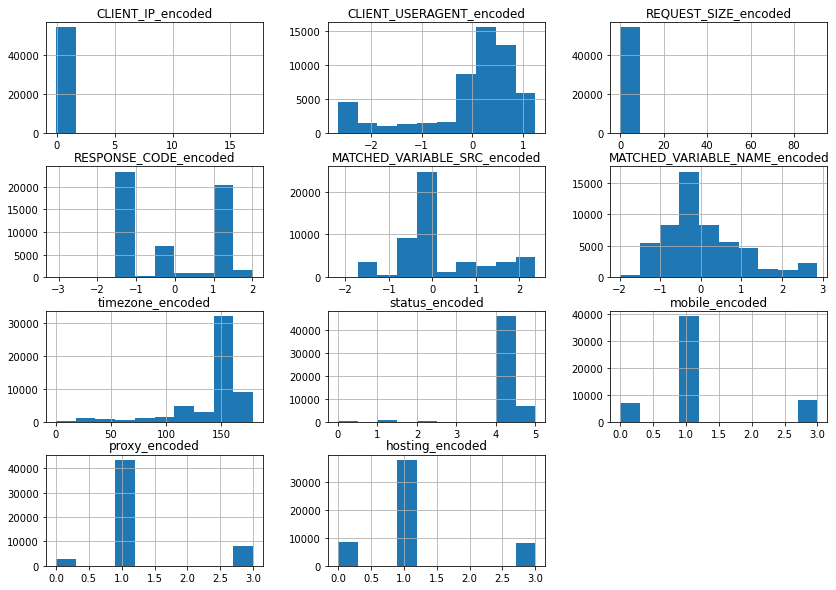

In [189]:
df_clean_train.hist(figsize=(14,10), layout=(-1,3));

In [190]:
from sklearn.cluster import DBSCAN

In [191]:
dbscan = DBSCAN(eps=0.5, min_samples=100)

clustering = dbscan.fit(df_clean_train)

In [192]:
cluster_labels = clustering.labels_
cluster_labels

array([-1, -1, -1, ..., 14, 14, -1], dtype=int64)

In [193]:
df_clean_train['Cluster_Label'] = cluster_labels
df_clean_train.head(2)

,CLIENT_IP_encoded,CLIENT_USERAGENT_encoded,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded,Cluster_Label
0,-0.06162,1.121433,-0.051146,1.013147,1.457262,-1.204552,154,4,1,1,0,-1
1,-0.06162,0.573423,-0.048862,-0.017069,-0.355067,2.696687,127,4,1,1,0,-1


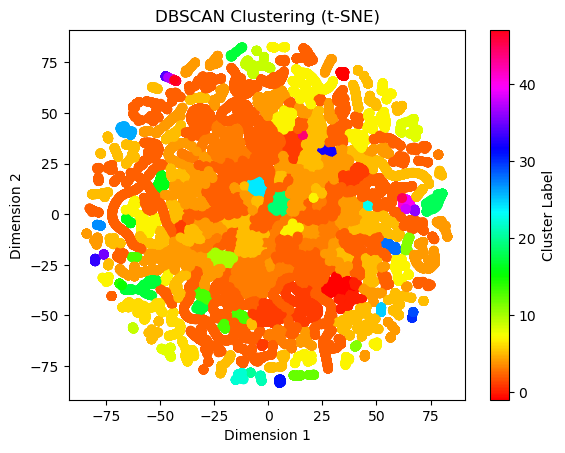

In [95]:
# это график датафрейма без доп инфы по ip адресам, как будто нормальный трафик выражается не так явно, 
# как в след графике,где уже используется доп признак по ip
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_clean_train)

plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=cluster_labels, cmap='hsv')
plt.title('DBSCAN Clustering (t-SNE)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.colorbar(label='Cluster Label')
plt.show()


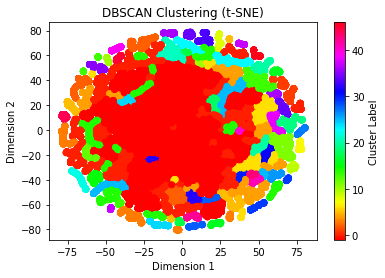

In [208]:
# with ip info
from sklearn.manifold import TSNE

tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_clean_train)

plt.scatter(data_reduced[:, 0], data_reduced[:, 1], c=cluster_labels, cmap='hsv')
plt.title('DBSCAN Clustering (t-SNE)')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.colorbar(label='Cluster Label')
plt.savefig('DBSCAN_46classes_ip_info.png')
plt.show()


In [194]:
cluster_labels.max(), cluster_labels.min()

(46, -1)

In [195]:
from joblib import dump
dump(dbscan, 'dbscan_model.joblib')

['dbscan_model.joblib']

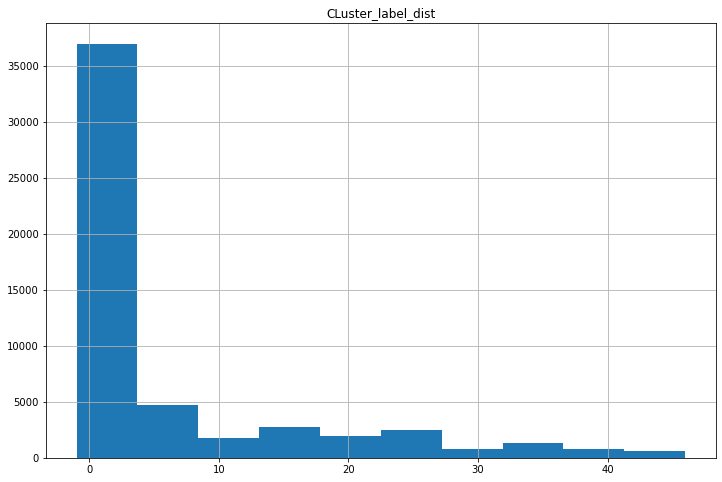

In [221]:
df_clean_train['Cluster_Label'].hist(figsize=(12,8))
plt.title('Cluster_label_dist')
plt.savefig('CLuster_label_dist.png')

In [192]:
import plotly.express as px

In [197]:
df_clean_train.columns


Index(['CLIENT_IP_encoded', 'CLIENT_USERAGENT_encoded', 'REQUEST_SIZE_encoded',
       'RESPONSE_CODE_encoded', 'MATCHED_VARIABLE_SRC_encoded',
       'MATCHED_VARIABLE_NAME_encoded', 'timezone_encoded', 'status_encoded',
       'mobile_encoded', 'proxy_encoded', 'hosting_encoded', 'Cluster_Label'],
      dtype='object')

In [222]:
# неплохая визуализация с (x='timezone_encoded', y='proxy_encoded', z='MATCHED_VARIABLE_SRC_encoded')
#и  (x='timezone_encoded',y='CLIENT_USERAGENT_encoded',z='RESPONSE_CODE_encoded')
fig = px.scatter_3d(df_clean_train, x='timezone_encoded', y='CLIENT_USERAGENT_encoded', 
                    z='RESPONSE_CODE_encoded', color='Cluster_Label')
fig.update_traces(marker=dict(size=3))
fig.show()

In [210]:
fig = px.scatter_3d(df_clean_train, x='timezone_encoded', y='proxy_encoded', 
                    z='MATCHED_VARIABLE_SRC_encoded', color='Cluster_Label')
fig.update_traces(marker=dict(size=3))
fig.show()

### проверка dbscan

In [82]:
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [212]:
# better higher
silhouette_dbscan = silhouette_score(df_clean_train,cluster_labels)
silhouette_dbscan

-0.009852776923673296

In [213]:
# better lower
davies_bouldin_dbscan = davies_bouldin_score(df_clean_train,cluster_labels)
davies_bouldin_dbscan

1.01761832984012

In [216]:
# преобразуем в еклидово пространство признаки и посчитаем силует_скор
df_clean_train['normalised_feats'] =  df_clean_train.apply(lambda x: np.linalg.norm([0]*11-x[['CLIENT_IP_encoded', 
                                                                                             'CLIENT_USERAGENT_encoded', 
                                                                                             'REQUEST_SIZE_encoded',
                                                                                             'RESPONSE_CODE_encoded', 
                                                                                             'MATCHED_VARIABLE_SRC_encoded',
                                                                                             'MATCHED_VARIABLE_NAME_encoded', 
                                                                                             'timezone_encoded', 'status_encoded',
                                                                                             'mobile_encoded', 'proxy_encoded', 'hosting_encoded']]),axis=1)


In [217]:
df_clean_train['normalised_feats'].head()

0    154.077464
1    127.101273
2     65.169586
3     24.550632
4     35.329024
Name: normalised_feats, dtype: float64

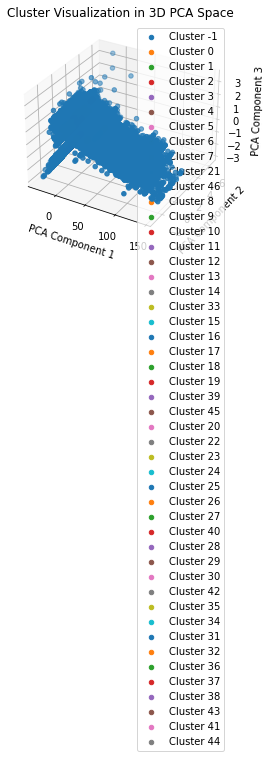

In [218]:
from sklearn.decomposition import PCA
pca_3 = PCA(n_components=3)
PCA_3d = pd.DataFrame(pca_3.fit_transform(df_clean_train.drop(['normalised_feats', 'Cluster_Label'], axis=1)))
PCA_3d.head()

# удалить
tmp = df_clean_train.reset_index()
tmp.drop(['index'],axis=1,inplace=True)
label_0=tmp[tmp['Cluster_Label']==0].index.tolist()
tmp.loc[label_0]

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for cluster_label in df_clean_train.Cluster_Label.unique():
    tmp = df_clean_train.reset_index()
    cluster_data = PCA_3d[(tmp['Cluster_Label']==cluster_label)]
    ax.scatter(cluster_data[0],cluster_data[1],cluster_data[2], label=f'Cluster {cluster_label}')
ax.set_xlabel('PCA Component 1')
ax.set_ylabel('PCA Component 2')
ax.set_zlabel('PCA Component 3') 
ax.set_title('Cluster Visualization in 3D PCA Space')
ax.legend()
plt.show()

In [219]:
silhouette_score(df_clean_train[['normalised_feats']], df_clean_train['Cluster_Label'].to_numpy())
                                                           

-0.570215136298234

In [48]:
df_clean_train.head(1)

,CLIENT_IP_encoded,CLIENT_USERAGENT_encoded,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded
0,-0.06162,1.121433,-0.051146,1.013147,1.457262,-1.204552,154,4,1,1,0


### другие алгоритмы

In [116]:
# HDBSCAN
import hdbscan
hdbscan = hdbscan.HDBSCAN(min_cluster_size=50, allow_single_cluster=True)

clusters_hdbscan = hdbscan.fit_predict(df_clean_train)
clusters_hdbscan.max(), clusters_hdbscan.min()

(238, -1)

In [101]:
from hdbscan import flat
# зададим кол-во классов
hdbscan = flat.HDBSCAN_flat(df_clean_train, n_clusters=50, prediction_data=True, allow_single_cluster=True)
clusters_hdbscan_50 = flat.approximate_predict_flat(hdbscan, df_clean_train, 50)

In [115]:
# labels_flat, proba_flat

clusters_hdbscan_50[0].max(), clusters_hdbscan_50[0].min()

(49, -1)

In [117]:
silhouette_hdbscan = silhouette_score(df_clean_train, clusters_hdbscan_50[0])
davies_bouldin_hdbscan = davies_bouldin_score(df_clean_train, clusters_hdbscan_50[0])
silhouette_hdbscan, davies_bouldin_hdbscan

(0.1427683657183452, 1.7192476853282428)

In [124]:
# кол-во кластеров=50
from sklearn.mixture import GaussianMixture
gmm = GaussianMixture(n_components=50)
clusters_gmm = gmm.fit_predict(df_clean_train)

In [125]:
clusters_gmm.max(),clusters_gmm.min()

(49, 0)

In [126]:
silhouette_gmm = silhouette_score(df_clean_train, clusters_gmm)
davies_bouldin_gmm = davies_bouldin_score(df_clean_train, clusters_gmm)
silhouette_gmm, davies_bouldin_gmm

(0.22521561665472892, 3.8809622912532062)

In [84]:
df_clean_train['Cluster_gmm'] = clusters_gmm
df_clean_train['Cluster_gmm'].value_counts()

38    11471
35     6229
37     5080
3      3570
24     2445
39     2186
34     1810
45     1624
1      1398
18     1358
40     1333
22     1330
30     1317
32     1118
20     1116
21      991
15      780
4       777
49      764
26      648
33      617
31      609
44      599
9       527
14      477
28      441
46      416
8       387
17      310
10      257
25      249
13      242
42      223
5       212
2       197
11      189
36      135
47      106
6       106
16       93
43       85
0        82
41       54
12       54
27       53
7        42
29       29
48        9
23        7
19        6
Name: Cluster_gmm, dtype: int64

In [77]:
df_clean_train.shape, df_clean_all.shape

((54158, 11), (54158, 22))

In [78]:
df_clean_train.tail()

,CLIENT_IP_encoded,CLIENT_USERAGENT_encoded,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded
56567,0.0,-0.042948,-0.047088,-1.047284,1.457262,-1.204552,176,3,2,2,2
56571,0.0,0.649692,-0.032570,-1.047284,-0.355067,2.109871,176,3,2,2,2
56573,0.0,0.884715,-0.045080,-1.047284,-1.487773,1.144264,176,3,2,2,2
56577,0.0,-0.042948,-0.048018,-1.047284,-1.487773,1.777653,176,3,2,2,2
56585,0.0,-0.265542,-0.045476,-1.047284,1.457262,-1.204552,176,3,2,2,2


In [79]:
df_clean_all.tail()

,CLIENT_IP,CLIENT_USERAGENT,REQUEST_SIZE,RESPONSE_CODE,MATCHED_VARIABLE_SRC,MATCHED_VARIABLE_NAME,timezone,status,mobile,proxy,hosting,REQUEST_SIZE_encoded,RESPONSE_CODE_encoded,CLIENT_USERAGENT_encoded,MATCHED_VARIABLE_SRC_encoded,MATCHED_VARIABLE_NAME_encoded,timezone_encoded,status_encoded,mobile_encoded,proxy_encoded,hosting_encoded,CLIENT_IP_encoded
56567,2a00:1370:8120:29a1:e89b:bb06:6f,Mozilla50WindowsNT100Win64x64AppleWebKit53736K...,637,200,REQUESTURI,NonDefined,NonDefined,NonDefined,3.0,3.0,3.0,-0.047088,-1.047284,-0.042948,1.457262,-1.204552,176,3,2,2,2,None
56571,2a02:c7d:1171:8300:2980:a4b7:4f9,Mozilla50WindowsUWindowsNT51ptPTrv1912Gecko200...,2322,200,REQUESTGETARGS,p,NonDefined,NonDefined,3.0,3.0,3.0,-0.032570,-1.047284,0.649692,-0.355067,2.109871,176,3,2,2,2,None
56573,2a00:1370:8112:4467:a57c:479b:8e,Mozilla50iPadCPUOS932likeMacOSXAppleWebKit6011...,870,200,REQUESTARGS,action,NonDefined,NonDefined,3.0,3.0,3.0,-0.045080,-1.047284,0.884715,-1.487773,1.144264,176,3,2,2,2,None
56577,2a02:2698:4c27:37bd:846c:d5bd:49,Mozilla50WindowsNT100Win64x64AppleWebKit53736K...,529,200,REQUESTARGS,image,NonDefined,NonDefined,3.0,3.0,3.0,-0.048018,-1.047284,-0.042948,-1.487773,1.777653,176,3,2,2,2,None
56585,2a00:1148:b0ba:2615:8b4:f98f:f56,Mozilla50MacintoshIntelMacOSX10116AppleWebKit5...,824,200,REQUESTURI,NonDefined,NonDefined,NonDefined,3.0,3.0,3.0,-0.045476,-1.047284,-0.265542,1.457262,-1.204552,176,3,2,2,2,None


In [158]:
from sklearn.cluster import KMeans
X = df_clean_train.values
kmeans = KMeans(n_clusters=47)
kmeans.fit(X)


KMeans(n_clusters=47)

In [159]:
clusters_kmeans = kmeans.predict(X)
clusters_kmeans.min(), clusters_kmeans.max()

(0, 46)

In [160]:
inertia = kmeans.inertia_
inertia

410247.8766519367

In [161]:
silhouette_kmeans = silhouette_score(X, clusters_kmeans)
davies_bouldin_kmeans = davies_bouldin_score(X, clusters_kmeans)
silhouette_kmeans, davies_bouldin_kmeans

(0.49923762668034066, 0.6981625308061526)

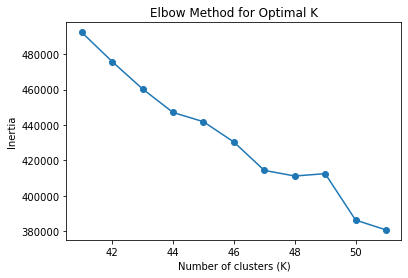

In [141]:
# кол-во классов = 47 дает наилучший скор для силуэт и дэвис_болдин скоров
inertia_values = []
k_values = range(41, 52) 

for k in k_values:
    kmeans = KMeans(n_clusters=k)
    kmeans.fit(X)
    inertia_values.append(kmeans.inertia_)

plt.plot(k_values, inertia_values, marker='o')
plt.xlabel('Number of clusters (K)')
plt.ylabel('Inertia')
plt.title('Elbow Method for Optimal K')
plt.show()